# Computer Vision 2022 Assignment 1: Image filtering

In this prac you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the prac are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [2]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np

#from skimage import io


# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

## Question 0: Numpy warm up! (5%)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


In [3]:
a = np.arange(12).reshape(3,4)
b = np.arange(12).reshape(4,3)

print(a)
print(b)

print(np.dot(a,b))

b_trans = b.transpose()
print(a*b_trans)

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]
[[ 0  1  2]
 [ 3  4  5]
 [ 6  7  8]
 [ 9 10 11]]
[[ 42  48  54]
 [114 136 158]
 [186 224 262]]
[[  0   3  12  27]
 [  4  20  42  70]
 [ 16  45  80 121]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel. 

In [4]:
def display(img, caption=''):
    # Show image using pyplot 
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

In [1]:
from skimage import io
img = io.imread('images/cat.jpg')

FileNotFoundError: No such file: '/Users/malujie/Computer-vision/images/cat.jpg'

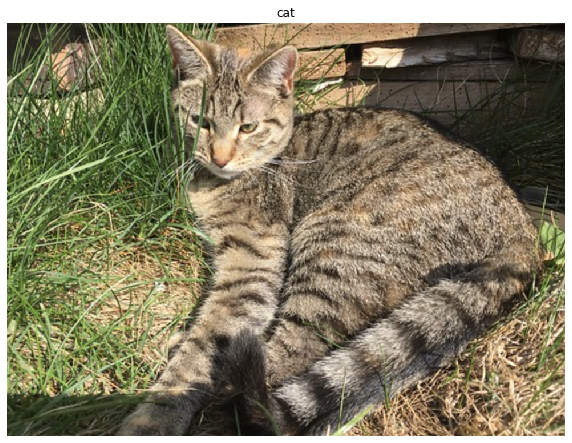

[[[0.14509804 0.1372549  0.08627451]
  [0.14117647 0.12941176 0.09411765]
  [0.1372549  0.1254902  0.09019608]
  ...
  [0.27058824 0.21960784 0.18823529]
  [0.25882353 0.22745098 0.17647059]
  [0.27058824 0.23137255 0.19607843]]

 [[0.14509804 0.1372549  0.09019608]
  [0.14117647 0.13333333 0.08627451]
  [0.13333333 0.12156863 0.08627451]
  ...
  [0.23529412 0.19215686 0.16862745]
  [0.23137255 0.19607843 0.16078431]
  [0.23921569 0.2        0.16470588]]

 [[0.14509804 0.13333333 0.09803922]
  [0.1372549  0.12941176 0.08235294]
  [0.12941176 0.12156863 0.0745098 ]
  ...
  [0.14117647 0.10588235 0.07843137]
  [0.1372549  0.10980392 0.07843137]
  [0.14509804 0.10980392 0.08235294]]

 ...

 [[0.18823529 0.21960784 0.1254902 ]
  [0.20784314 0.23921569 0.14509804]
  [0.22745098 0.25882353 0.16470588]
  ...
  [0.41568627 0.30980392 0.19607843]
  [0.50196078 0.40392157 0.28235294]
  [0.58039216 0.46666667 0.34901961]]

 [[0.18823529 0.21960784 0.1254902 ]
  [0.22745098 0.24705882 0.15686275]


In [217]:
image1 = load('images/cat.jpg')
display(image1, 'cat')
print_stats(image1)

Return to this question after reading through the rest of the assignment. Find 2 more images to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

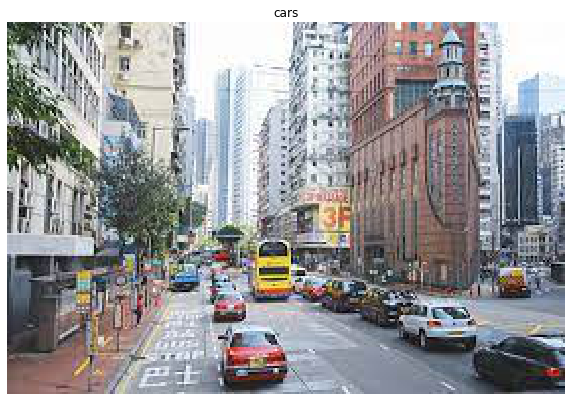

[[[0.12156863 0.18039216 0.16078431]
  [0.18431373 0.24313725 0.22352941]
  [0.1372549  0.19607843 0.16862745]
  ...
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]]

 [[0.07843137 0.1372549  0.11764706]
  [0.21176471 0.27058824 0.24313725]
  [0.12941176 0.19215686 0.15294118]
  ...
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]]

 [[0.12941176 0.18823529 0.16078431]
  [0.08235294 0.14509804 0.10588235]
  [0.2        0.2627451  0.21960784]
  ...
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]]

 ...

 [[0.51764706 0.39607843 0.38823529]
  [0.52156863 0.4        0.39215686]
  [0.5254902  0.40392157 0.39215686]
  ...
  [0.15686275 0.20784314 0.27058824]
  [0.15686275 0.20784314 0.27058824]
  [0.16470588 0.21568627 0.27843137]]

 [[0.50980392 0.38823529 0.38039216]
  [0.51372549 0.39215686 0.38431373]


In [218]:
image_2 = load('images/many_cars.jpg')
display(image_2, 'cars')
print_stats(image_2)

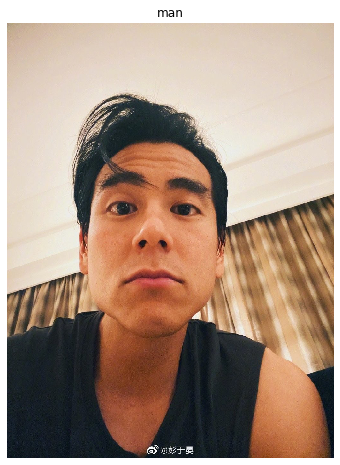

[[[0.69803922 0.6        0.52156863]
  [0.70588235 0.60784314 0.52941176]
  [0.69411765 0.59607843 0.50980392]
  ...
  [0.83137255 0.73333333 0.65490196]
  [0.82352941 0.7254902  0.64705882]
  [0.81176471 0.71372549 0.63529412]]

 [[0.65098039 0.55294118 0.4745098 ]
  [0.6627451  0.56470588 0.48627451]
  [0.67843137 0.58039216 0.49411765]
  ...
  [0.82352941 0.7254902  0.64705882]
  [0.82745098 0.72941176 0.65098039]
  [0.82745098 0.72941176 0.65098039]]

 [[0.65882353 0.56078431 0.48235294]
  [0.68235294 0.58431373 0.50588235]
  [0.69411765 0.59607843 0.50980392]
  ...
  [0.81568627 0.71764706 0.63921569]
  [0.82352941 0.7254902  0.64705882]
  [0.83529412 0.7372549  0.65882353]]

 ...

 [[0.07058824 0.10980392 0.15686275]
  [0.05490196 0.09411765 0.14117647]
  [0.04705882 0.08627451 0.13333333]
  ...
  [0.03529412 0.07058824 0.1372549 ]
  [0.04313725 0.07843137 0.14509804]
  [0.01176471 0.05882353 0.12156863]]

 [[0.08235294 0.12156863 0.16862745]
  [0.06666667 0.10588235 0.15294118]


In [219]:
image_3 = load('images/man.jpg')
display(image_3, 'man')
print_stats(image_3)

***Your explanation of images here***

****

- To use the many_cars.jpg image, I try to crop a car (randomly) and see could it find the correct position of this car by using the cross correlation function.

- To use the man.jpg image, I try to crop one eye and see could it find the correct position of the correct eye by using the cross correlation function. (Becasue each person has two eyes)

## Question 2: Image processing (20%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

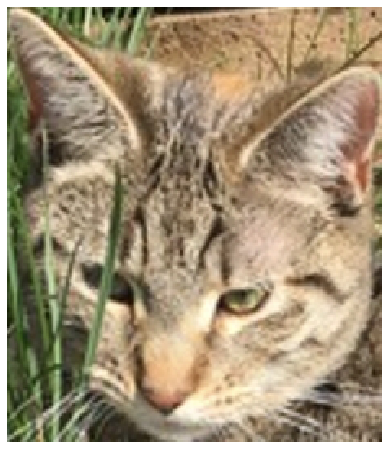

[[[0.31372549 0.34117647 0.20784314]
  [0.36078431 0.36470588 0.23921569]
  [0.49803922 0.48627451 0.35686275]
  ...
  [0.73333333 0.59215686 0.45882353]
  [0.75294118 0.61176471 0.47843137]
  [0.74117647 0.6        0.46666667]]

 [[0.42352941 0.45490196 0.30980392]
  [0.52156863 0.5254902  0.39215686]
  [0.70196078 0.68235294 0.55686275]
  ...
  [0.74117647 0.60784314 0.47058824]
  [0.75686275 0.62352941 0.48627451]
  [0.74117647 0.6        0.46666667]]

 [[0.49411765 0.51764706 0.37647059]
  [0.61176471 0.61568627 0.48235294]
  [0.79607843 0.77254902 0.64705882]
  ...
  [0.75294118 0.61960784 0.48235294]
  [0.75294118 0.61960784 0.48235294]
  [0.72941176 0.59607843 0.45882353]]

 ...

 [[0.52156863 0.56862745 0.48235294]
  [0.54509804 0.59215686 0.49803922]
  [0.54117647 0.59215686 0.48235294]
  ...
  [0.36862745 0.30980392 0.23529412]
  [0.29019608 0.23137255 0.15686275]
  [0.27058824 0.21176471 0.1372549 ]]

 [[0.57647059 0.62352941 0.5372549 ]
  [0.48235294 0.52941176 0.43529412]


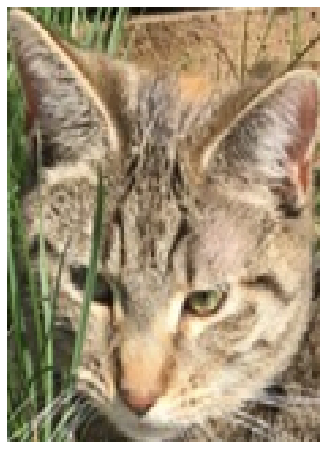

[[[0.31372549 0.34117647 0.20784314]
  [0.49803922 0.48627451 0.35686275]
  [0.65490196 0.61960784 0.49019608]
  ...
  [0.7372549  0.58823529 0.44705882]
  [0.72156863 0.58039216 0.44705882]
  [0.75294118 0.61176471 0.47843137]]

 [[0.42352941 0.45490196 0.30980392]
  [0.70196078 0.68235294 0.55686275]
  [0.82745098 0.76862745 0.65490196]
  ...
  [0.70980392 0.56862745 0.43529412]
  [0.72941176 0.58823529 0.45490196]
  [0.75686275 0.62352941 0.48627451]]

 [[0.5254902  0.54901961 0.40784314]
  [0.78431373 0.76078431 0.63529412]
  [0.81960784 0.7372549  0.63137255]
  ...
  [0.35686275 0.21960784 0.10196078]
  [0.63921569 0.50196078 0.37647059]
  [0.74117647 0.61176471 0.4745098 ]]

 ...

 [[0.25098039 0.30980392 0.21960784]
  [0.17647059 0.23529412 0.11372549]
  [0.5372549  0.59607843 0.44313725]
  ...
  [0.47058824 0.41176471 0.32941176]
  [0.38431373 0.3254902  0.25098039]
  [0.32941176 0.26666667 0.20392157]]

 [[0.42745098 0.4745098  0.38823529]
  [0.53333333 0.58431373 0.4745098 ]


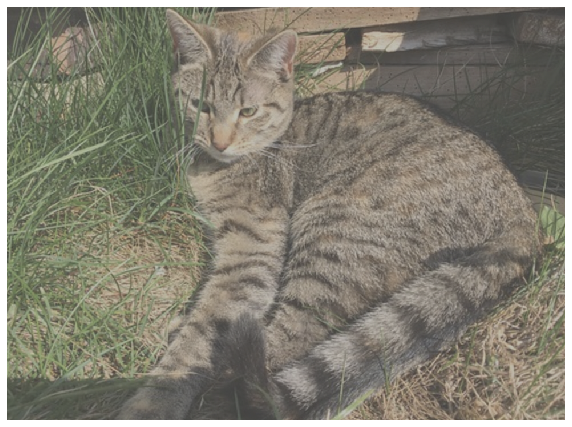

[[[0.32254902 0.31862745 0.29313725]
  [0.32058824 0.31470588 0.29705882]
  [0.31862745 0.3127451  0.29509804]
  ...
  [0.38529412 0.35980392 0.34411765]
  [0.37941176 0.36372549 0.33823529]
  [0.38529412 0.36568627 0.34803922]]

 [[0.32254902 0.31862745 0.29509804]
  [0.32058824 0.31666667 0.29313725]
  [0.31666667 0.31078431 0.29313725]
  ...
  [0.36764706 0.34607843 0.33431373]
  [0.36568627 0.34803922 0.33039216]
  [0.36960784 0.35       0.33235294]]

 [[0.32254902 0.31666667 0.29901961]
  [0.31862745 0.31470588 0.29117647]
  [0.31470588 0.31078431 0.2872549 ]
  ...
  [0.32058824 0.30294118 0.28921569]
  [0.31862745 0.30490196 0.28921569]
  [0.32254902 0.30490196 0.29117647]]

 ...

 [[0.34411765 0.35980392 0.3127451 ]
  [0.35392157 0.36960784 0.32254902]
  [0.36372549 0.37941176 0.33235294]
  ...
  [0.45784314 0.40490196 0.34803922]
  [0.50098039 0.45196078 0.39117647]
  [0.54019608 0.48333333 0.4245098 ]]

 [[0.34411765 0.35980392 0.3127451 ]
  [0.36372549 0.37352941 0.32843137]


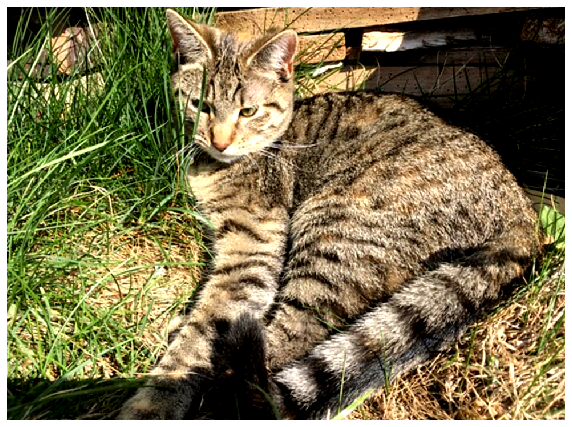

[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15588235 0.07941176 0.03235294]
  [0.13823529 0.09117647 0.01470588]
  [0.15588235 0.09705882 0.04411765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10294118 0.03823529 0.00294118]
  [0.09705882 0.04411765 0.        ]
  [0.10882353 0.05       0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 ...

 [[0.03235294 0.07941176 0.        ]
  [0.06176471 0.10882353 0.        ]
  [0.09117647 0.13823529 0.        ]
  ...
  [0.37352941 0.21470588 0.04411765]
  [0.50294118 0.35588235 0.17352941]
  [0.62058824 0.45       0.27352941]]

 [[0.03235294 0.07941176 0.        ]
  [0.09117647 0.12058824 0.        ]


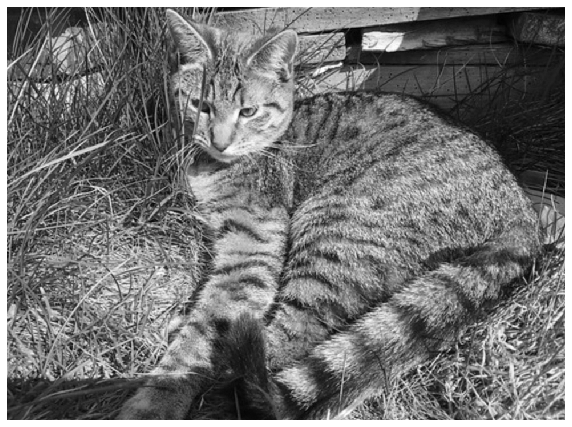

[[0.12287582 0.12156863 0.11764706 ... 0.22614379 0.22091503 0.23267974]
 [0.12418301 0.12026144 0.11372549 ... 0.19869281 0.19607843 0.20130719]
 [0.1254902  0.11633987 0.10849673 ... 0.10849673 0.10849673 0.1124183 ]
 ...
 [0.17777778 0.19738562 0.21699346 ... 0.30718954 0.39607843 0.46535948]
 [0.17777778 0.21045752 0.25751634 ... 0.34771242 0.36862745 0.4       ]
 [0.20261438 0.23398693 0.27712418 ... 0.45751634 0.44705882 0.45228758]]


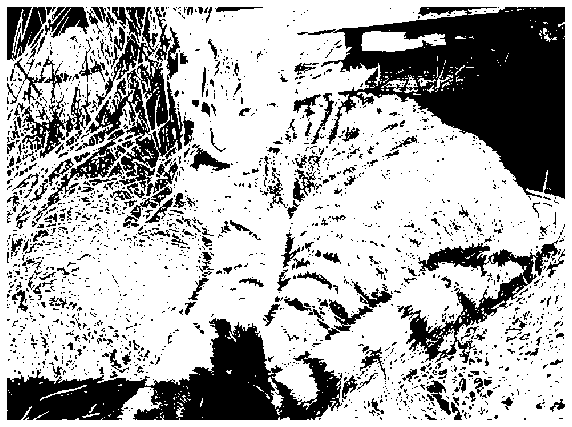

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]]


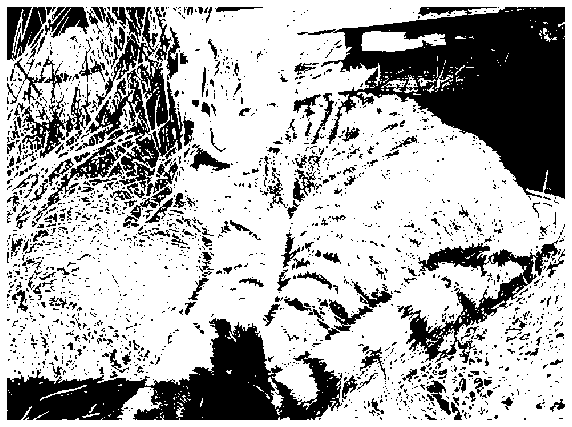

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]]


In [220]:
# This should crop the head from the cat image
crop_img = crop(image1, 278, 5, 508, 272)
display(crop_img) 
print_stats(crop_img)
# print(crop_img.shape)

resize_img = resize(crop_img, 0.5, 0.6 )
display(resize_img)
print_stats(resize_img)
# print(resize_img.shape)

contrast_img = change_contrast(image1, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image1, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image1)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

# Add your own tests here...


***

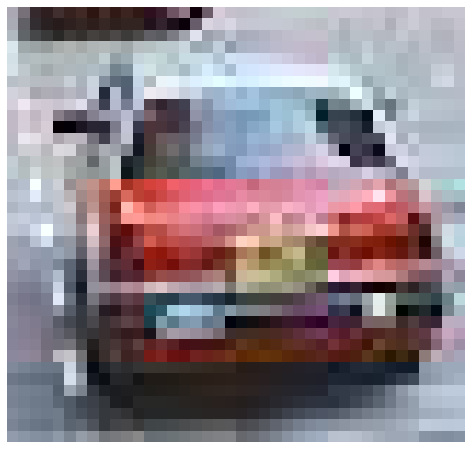

[[[0.67058824 0.65882353 0.70196078]
  [0.46666667 0.43921569 0.47058824]
  [0.20784314 0.16078431 0.17647059]
  ...
  [0.76862745 0.76078431 0.80392157]
  [0.78431373 0.77647059 0.81960784]
  [0.78431373 0.77647059 0.81960784]]

 [[0.6627451  0.6745098  0.70980392]
  [0.38039216 0.37647059 0.4       ]
  [0.19607843 0.17647059 0.19215686]
  ...
  [0.7254902  0.7254902  0.76470588]
  [0.72941176 0.72941176 0.76862745]
  [0.76862745 0.76078431 0.80392157]]

 [[0.69019608 0.7254902  0.75294118]
  [0.37647059 0.39607843 0.41176471]
  [0.2745098  0.27843137 0.28627451]
  ...
  [0.69411765 0.70588235 0.74117647]
  [0.69803922 0.69803922 0.7372549 ]
  [0.74509804 0.74509804 0.78431373]]

 ...

 [[0.50588235 0.54117647 0.60784314]
  [0.47058824 0.51764706 0.58039216]
  [0.44313725 0.49019608 0.55294118]
  ...
  [0.63921569 0.68627451 0.74901961]
  [0.65098039 0.70196078 0.76862745]
  [0.6745098  0.7254902  0.79215686]]

 [[0.48235294 0.51764706 0.58431373]
  [0.44313725 0.49019608 0.55294118]


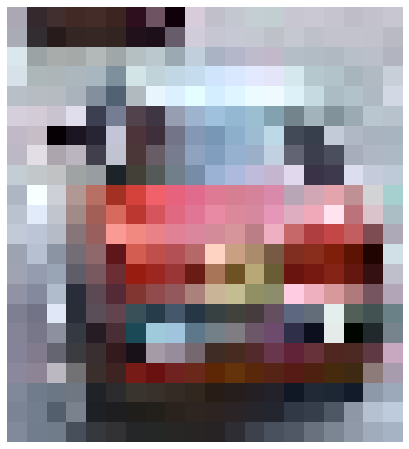

[[[0.67058824 0.65882353 0.70196078]
  [0.20784314 0.16078431 0.17647059]
  [0.25490196 0.18431373 0.18431373]
  ...
  [0.74901961 0.74117647 0.78431373]
  [0.76470588 0.75686275 0.8       ]
  [0.78431373 0.77647059 0.81960784]]

 [[0.6627451  0.6745098  0.70980392]
  [0.19607843 0.17647059 0.19215686]
  [0.15294118 0.10588235 0.10588235]
  ...
  [0.76470588 0.76470588 0.80392157]
  [0.76078431 0.76078431 0.8       ]
  [0.72941176 0.72941176 0.76862745]]

 [[0.85490196 0.90588235 0.92941176]
  [0.60784314 0.63921569 0.64705882]
  [0.65882353 0.6745098  0.67058824]
  ...
  [0.72156863 0.74901961 0.78823529]
  [0.73333333 0.74901961 0.79215686]
  [0.69803922 0.70588235 0.75294118]]

 ...

 [[0.50196078 0.5372549  0.60392157]
  [0.43921569 0.48627451 0.54901961]
  [0.41960784 0.46666667 0.52156863]
  ...
  [0.07058824 0.10588235 0.16470588]
  [0.55294118 0.6        0.6627451 ]
  [0.61176471 0.6627451  0.72941176]]

 [[0.48235294 0.51764706 0.58431373]
  [0.44705882 0.49411765 0.55686275]


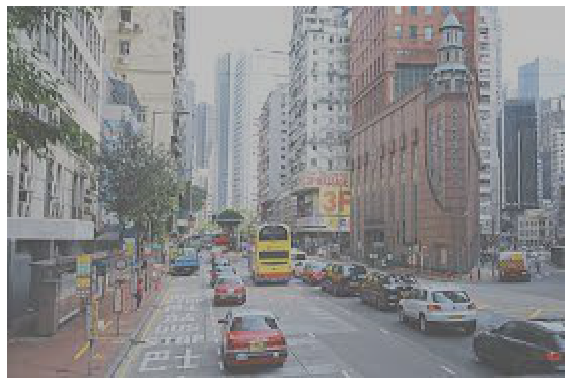

[[[0.31078431 0.34019608 0.33039216]
  [0.34215686 0.37156863 0.36176471]
  [0.31862745 0.34803922 0.33431373]
  ...
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]]

 [[0.28921569 0.31862745 0.30882353]
  [0.35588235 0.38529412 0.37156863]
  [0.31470588 0.34607843 0.32647059]
  ...
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]]

 [[0.31470588 0.34411765 0.33039216]
  [0.29117647 0.32254902 0.30294118]
  [0.35       0.38137255 0.35980392]
  ...
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]
  [0.74607843 0.74607843 0.74607843]]

 ...

 [[0.50882353 0.44803922 0.44411765]
  [0.51078431 0.45       0.44607843]
  [0.5127451  0.45196078 0.44607843]
  ...
  [0.32843137 0.35392157 0.38529412]
  [0.32843137 0.35392157 0.38529412]
  [0.33235294 0.35784314 0.38921569]]

 [[0.50490196 0.44411765 0.44019608]
  [0.50686275 0.44607843 0.44215686]


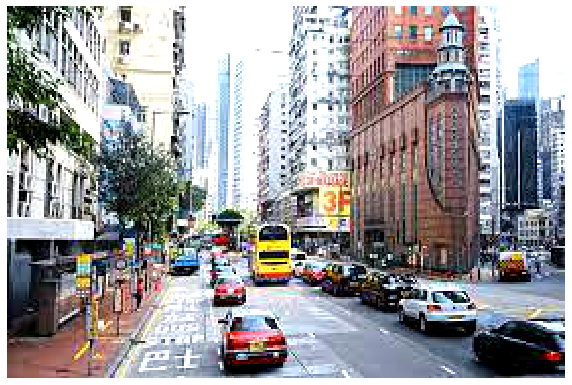

[[[0.         0.02058824 0.        ]
  [0.02647059 0.11470588 0.08529412]
  [0.         0.04411765 0.00294118]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[0.         0.         0.        ]
  [0.06764706 0.15588235 0.11470588]
  [0.         0.03823529 0.        ]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[0.         0.03235294 0.        ]
  [0.         0.         0.        ]
  [0.05       0.14411765 0.07941176]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 ...

 [[0.52647059 0.34411765 0.33235294]
  [0.53235294 0.35       0.33823529]
  [0.53823529 0.35588235 0.33823529]
  ...
  [0.         0.06176471 0.15588235]
  [0.         0.06176471 0.15588235]
  [0.         0.07352941 0.16764706]]

 [[0.51470588 0.33235294 0.32058824]
  [0.52058824 0.33823529 0.32647059]


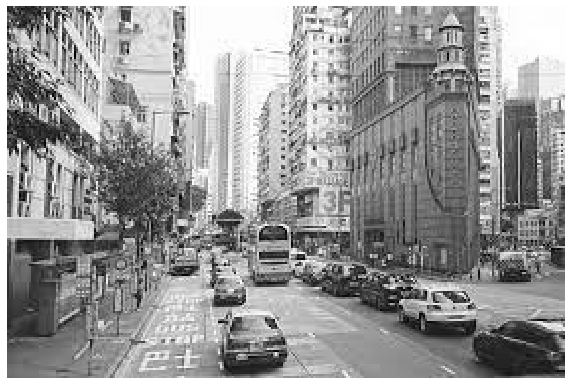

[[0.15424837 0.21699346 0.16732026 ... 0.99215686 0.99215686 0.99215686]
 [0.11111111 0.24183007 0.15816993 ... 0.99215686 0.99215686 0.99215686]
 [0.15947712 0.11111111 0.22745098 ... 0.99215686 0.99215686 0.99215686]
 ...
 [0.43398693 0.4379085  0.44052288 ... 0.21176471 0.21176471 0.21960784]
 [0.42614379 0.43006536 0.43267974 ... 0.30980392 0.31372549 0.31372549]
 [0.41437908 0.41830065 0.42091503 ... 0.4248366  0.4248366  0.42091503]]


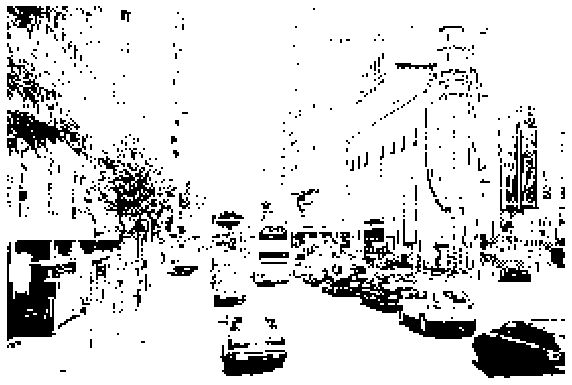

[[0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


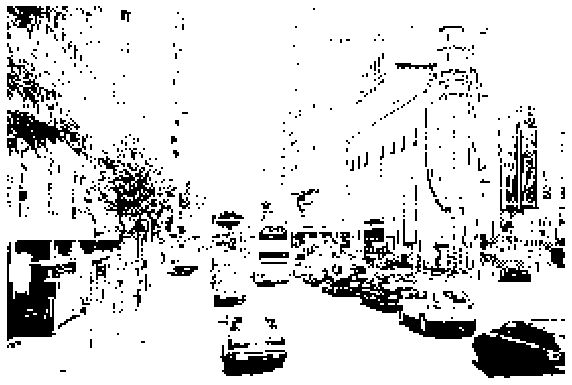

[[0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


In [222]:
# this crop image should return a red car
crop_img_2 = crop(image_2, 100, 145, 140, 200)
display(crop_img_2) 
print_stats(crop_img_2)

resize_img = resize(crop_img_2, 0.5, 0.6 )
display(resize_img)
print_stats(resize_img)

contrast_img = change_contrast(image_2, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image_2, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image_2)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

***

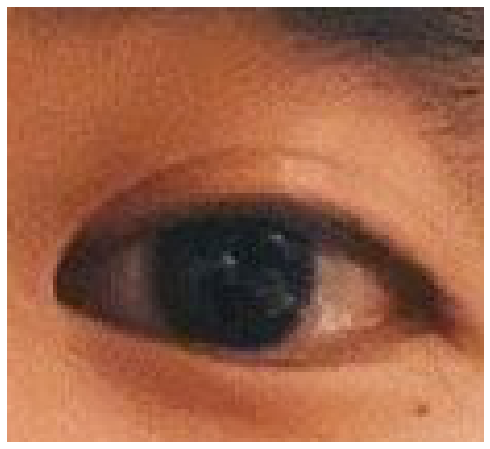

[[[0.64313725 0.38431373 0.25098039]
  [0.60392157 0.34509804 0.21960784]
  [0.54117647 0.28627451 0.16862745]
  ...
  [0.30588235 0.22352941 0.20392157]
  [0.30588235 0.22352941 0.21176471]
  [0.34901961 0.25490196 0.24705882]]

 [[0.63921569 0.37254902 0.23529412]
  [0.60784314 0.34901961 0.21568627]
  [0.56078431 0.30588235 0.18039216]
  ...
  [0.38823529 0.30588235 0.28627451]
  [0.36078431 0.27843137 0.26666667]
  [0.35686275 0.2745098  0.2627451 ]]

 [[0.61960784 0.35294118 0.21568627]
  [0.61176471 0.34117647 0.21176471]
  [0.58039216 0.32156863 0.19607843]
  ...
  [0.34509804 0.27058824 0.24705882]
  [0.36862745 0.28627451 0.26666667]
  [0.32941176 0.24705882 0.23529412]]

 ...

 [[0.88627451 0.59607843 0.44313725]
  [0.89411765 0.60392157 0.45098039]
  [0.87843137 0.59215686 0.43137255]
  ...
  [0.89019608 0.64705882 0.50196078]
  [0.91372549 0.67843137 0.53333333]
  [0.89411765 0.65882353 0.51372549]]

 [[0.87843137 0.58823529 0.43529412]
  [0.89019608 0.6        0.44705882]


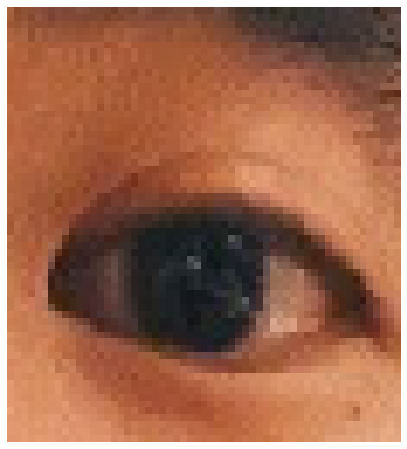

[[[0.64313725 0.38431373 0.25098039]
  [0.54117647 0.28627451 0.16862745]
  [0.55686275 0.31764706 0.20784314]
  ...
  [0.31372549 0.22745098 0.18431373]
  [0.32156863 0.23137255 0.2       ]
  [0.30588235 0.22352941 0.20392157]]

 [[0.63921569 0.37254902 0.23529412]
  [0.56078431 0.30588235 0.18039216]
  [0.57254902 0.32156863 0.21176471]
  ...
  [0.26666667 0.18823529 0.15294118]
  [0.35686275 0.27843137 0.25098039]
  [0.38823529 0.30588235 0.28627451]]

 [[0.61568627 0.34117647 0.20784314]
  [0.59215686 0.33333333 0.2       ]
  [0.61568627 0.36078431 0.24313725]
  ...
  [0.34901961 0.28235294 0.25098039]
  [0.34509804 0.27843137 0.25098039]
  [0.34509804 0.27058824 0.24705882]]

 ...

 [[0.88627451 0.59607843 0.44313725]
  [0.88627451 0.6        0.43921569]
  [0.8745098  0.58823529 0.42745098]
  ...
  [0.87058824 0.62745098 0.4745098 ]
  [0.90588235 0.6627451  0.50980392]
  [0.86666667 0.62352941 0.47843137]]

 [[0.89019608 0.6        0.44705882]
  [0.88235294 0.59607843 0.43529412]


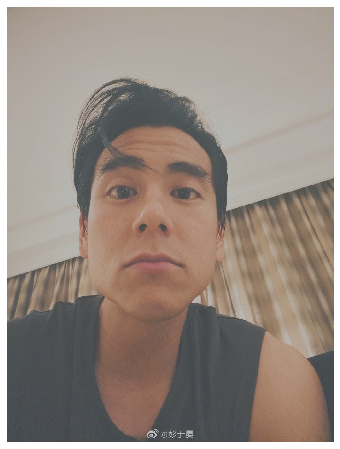

[[[0.59901961 0.55       0.51078431]
  [0.60294118 0.55392157 0.51470588]
  [0.59705882 0.54803922 0.50490196]
  ...
  [0.66568627 0.61666667 0.57745098]
  [0.66176471 0.6127451  0.57352941]
  [0.65588235 0.60686275 0.56764706]]

 [[0.5754902  0.52647059 0.4872549 ]
  [0.58137255 0.53235294 0.49313725]
  [0.58921569 0.54019608 0.49705882]
  ...
  [0.66176471 0.6127451  0.57352941]
  [0.66372549 0.61470588 0.5754902 ]
  [0.66372549 0.61470588 0.5754902 ]]

 [[0.57941176 0.53039216 0.49117647]
  [0.59117647 0.54215686 0.50294118]
  [0.59705882 0.54803922 0.50490196]
  ...
  [0.65784314 0.60882353 0.56960784]
  [0.66176471 0.6127451  0.57352941]
  [0.66764706 0.61862745 0.57941176]]

 ...

 [[0.28529412 0.30490196 0.32843137]
  [0.27745098 0.29705882 0.32058824]
  [0.27352941 0.29313725 0.31666667]
  ...
  [0.26764706 0.28529412 0.31862745]
  [0.27156863 0.28921569 0.32254902]
  [0.25588235 0.27941176 0.31078431]]

 [[0.29117647 0.31078431 0.33431373]
  [0.28333333 0.30294118 0.32647059]


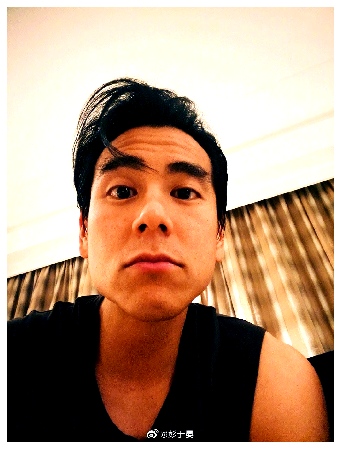

[[[0.79705882 0.65       0.53235294]
  [0.80882353 0.66176471 0.54411765]
  [0.79117647 0.64411765 0.51470588]
  ...
  [0.99705882 0.85       0.73235294]
  [0.98529412 0.83823529 0.72058824]
  [0.96764706 0.82058824 0.70294118]]

 [[0.72647059 0.57941176 0.46176471]
  [0.74411765 0.59705882 0.47941176]
  [0.76764706 0.62058824 0.49117647]
  ...
  [0.98529412 0.83823529 0.72058824]
  [0.99117647 0.84411765 0.72647059]
  [0.99117647 0.84411765 0.72647059]]

 [[0.73823529 0.59117647 0.47352941]
  [0.77352941 0.62647059 0.50882353]
  [0.79117647 0.64411765 0.51470588]
  ...
  [0.97352941 0.82647059 0.70882353]
  [0.98529412 0.83823529 0.72058824]
  [1.         0.85588235 0.73823529]]

 ...

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.00294118]
  [0.         0.         0.        ]


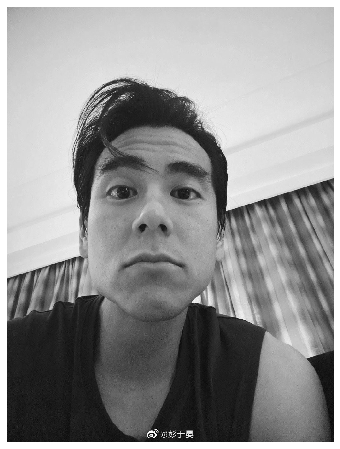

[[0.60653595 0.61437908 0.6        ... 0.73986928 0.73202614 0.72026144]
 [0.55947712 0.57124183 0.58431373 ... 0.73202614 0.73594771 0.73594771]
 [0.56732026 0.59084967 0.6        ... 0.72418301 0.73202614 0.74379085]
 ...
 [0.1124183  0.09673203 0.08888889 ... 0.08104575 0.08888889 0.06405229]
 [0.12418301 0.10849673 0.09281046 ... 0.07712418 0.09673203 0.08366013]
 [0.1124183  0.10065359 0.08496732 ... 0.07712418 0.10457516 0.09542484]]


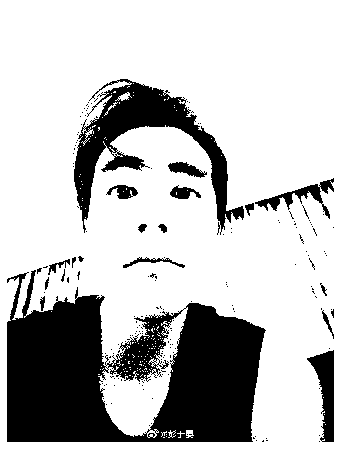

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


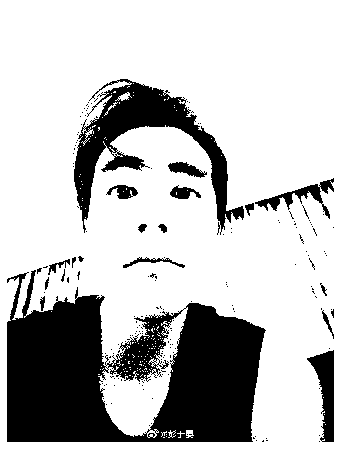

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [224]:
# this crop image should return a eye
crop_img_3 = crop(image_3, 500, 520, 615, 625)
display(crop_img_3) 
print_stats(crop_img_3)

resize_img = resize(crop_img_3, 0.5, 0.6)
display(resize_img)
print_stats(resize_img)

contrast_img = change_contrast(image_3, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image_3, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image_3)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

***

***What do you observe when you change the threshold of the binary function?***

- Thresholding represents a binary image, where all pixels compare with a value, if they above the value, they turn on, and if they below the value, they turn off.

- using binary() function, the pixel all changed to a boolean, hence they are all changed to value 0(off) and 1(on).


***

## Question 3: Convolution (20%)

### 3.1 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


### 3.2 RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently. 

### 3.3 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

### 3.4 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters

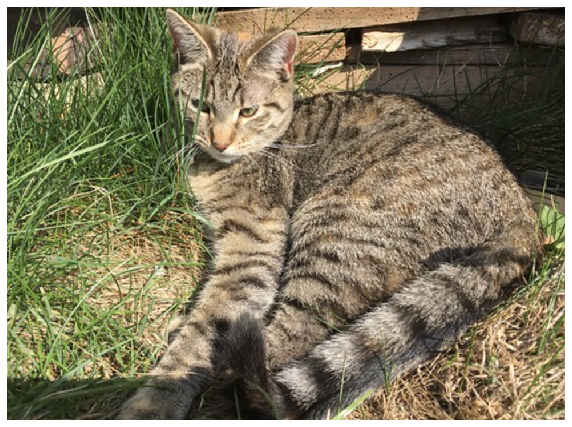

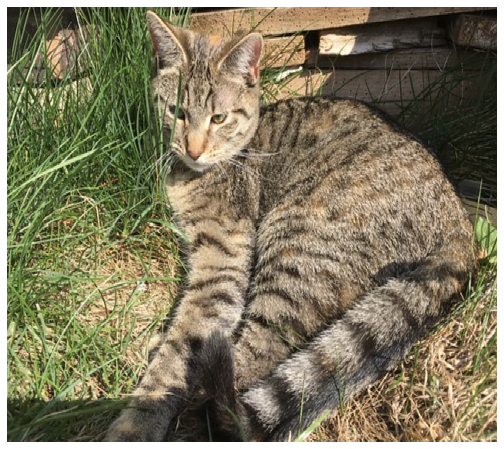

--------    gaussian filters    --------


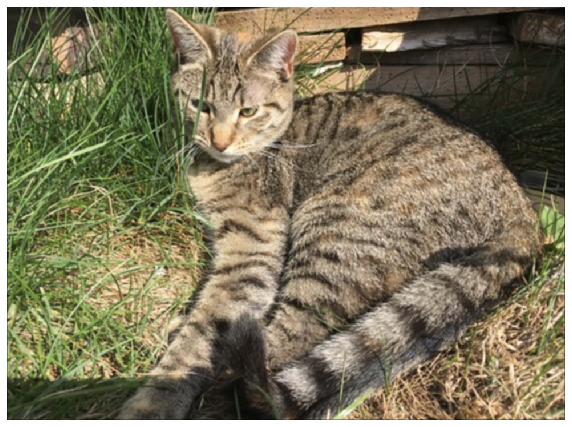

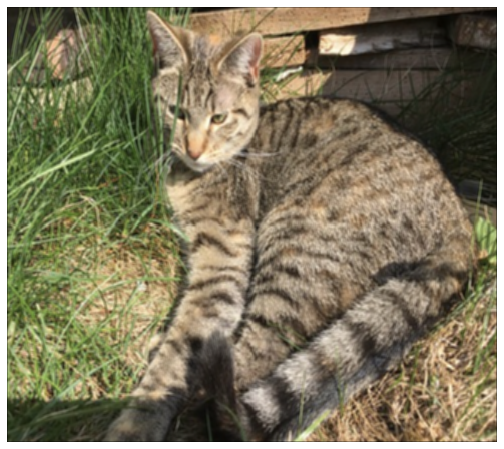

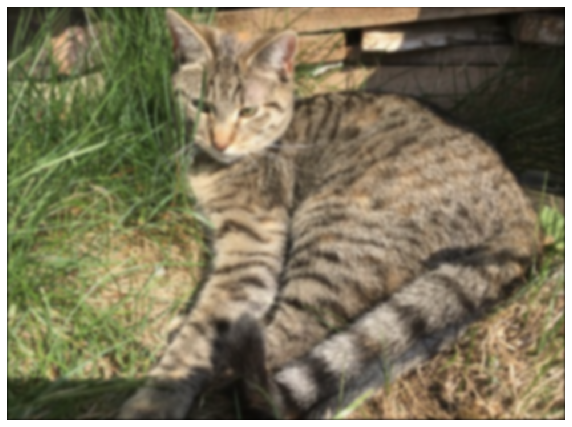

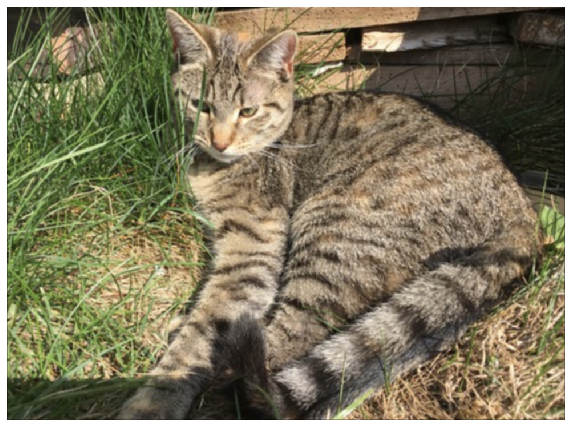

--------      sobel filters     --------


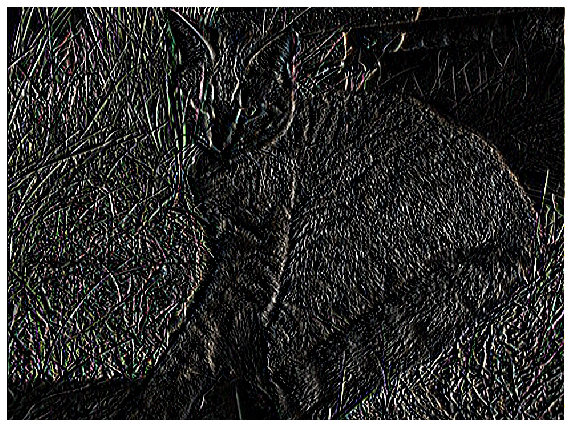

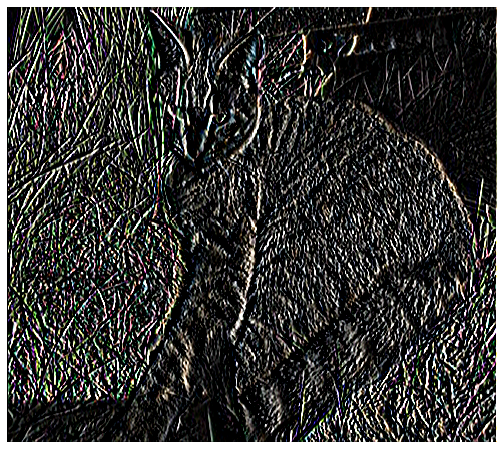

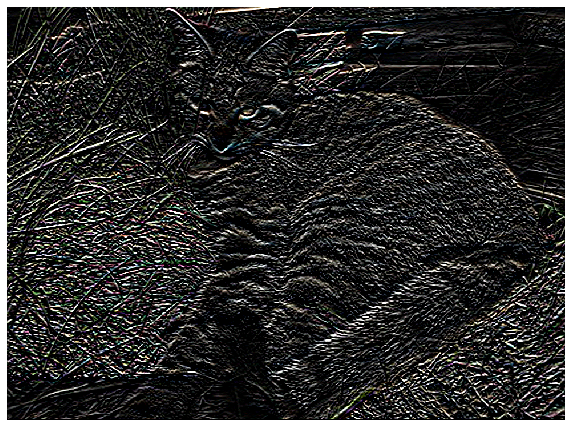

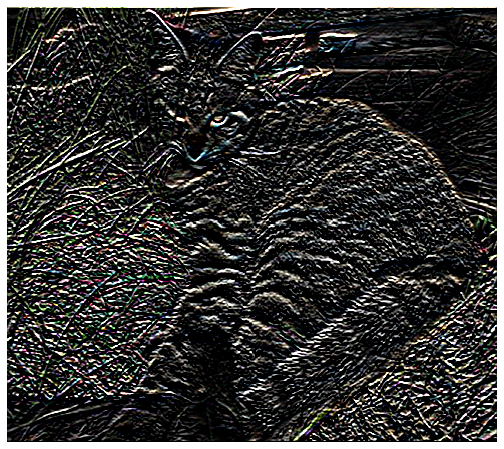

In [225]:
# Your code to answer 3.3, 3.4 and displaay results here.
image1 = load('images/cat.jpg')
display(image1)
resize_img = resize(image1, 0.5, 0.6) #resize the image
display(resize_img)

print("--------    gaussian filters    --------")

# gauss kernel
gauss_kernel_1 = gauss2D(3, 3)
gauss_kernel_2 = gauss2D(20, 3)
gauss_kernel_3 = gauss2D(20, 1)

new_img_1 = conv(image1, gauss_kernel_1)
new_img_11 = conv(resize_img, gauss_kernel_1)
new_img_2 = conv(image1, gauss_kernel_2)
new_img_3 = conv(image1, gauss_kernel_3)

display(new_img_1)
display(new_img_11)
display(new_img_2)
display(new_img_3)

print("--------      sobel filters     --------")

# sobel kernel
sobel_kernel_veritcal = np.array(
    [
        [-1,0,1],
        [-2,0,2],
        [-1,0,1]
    ])

sobel_kernel_horizontal = np.array(
    [
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])

new_img_4 = conv(image1, sobel_kernel_veritcal)
new_img_44 = conv(resize_img, sobel_kernel_veritcal)
new_img_5 = conv(image1, sobel_kernel_horizontal)
new_img_55 = conv(resize_img, sobel_kernel_horizontal)

display(new_img_4)
display(new_img_44)
display(new_img_5)
display(new_img_55)

***

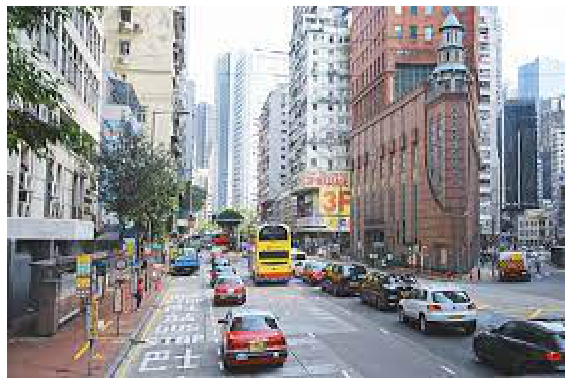

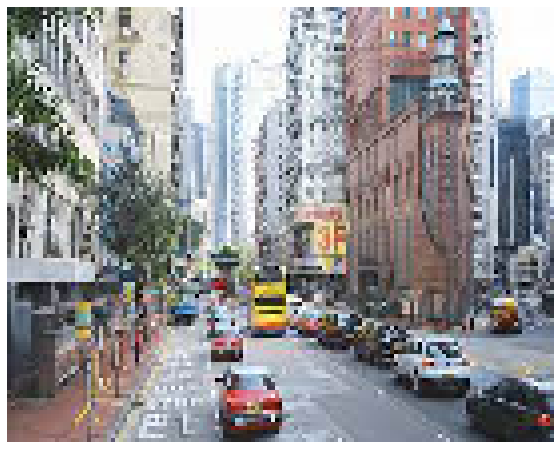

--------    gaussian filters    --------


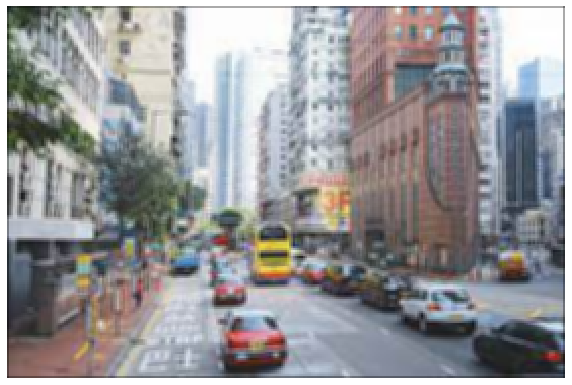

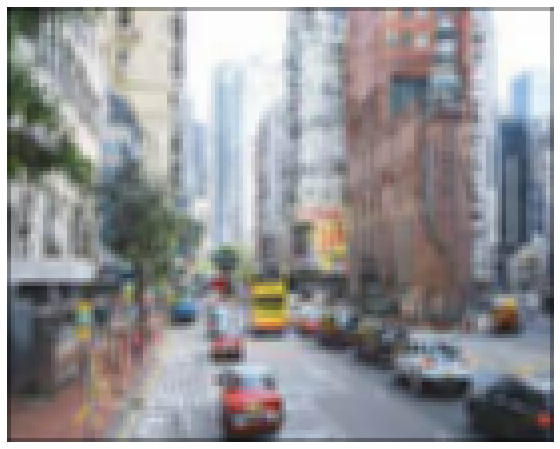

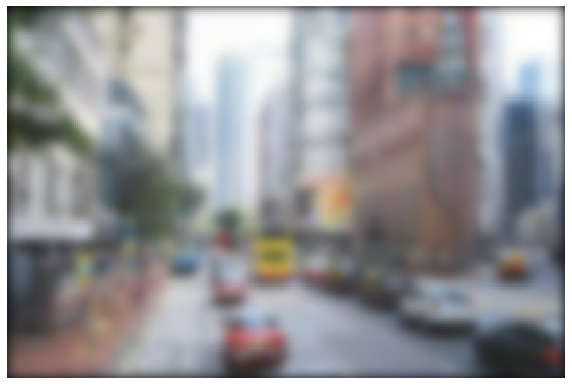

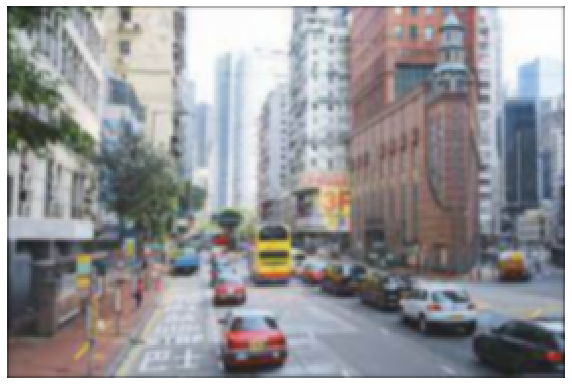

--------      sobel filters     --------


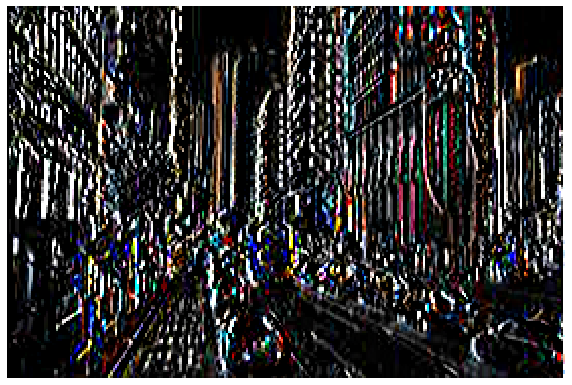

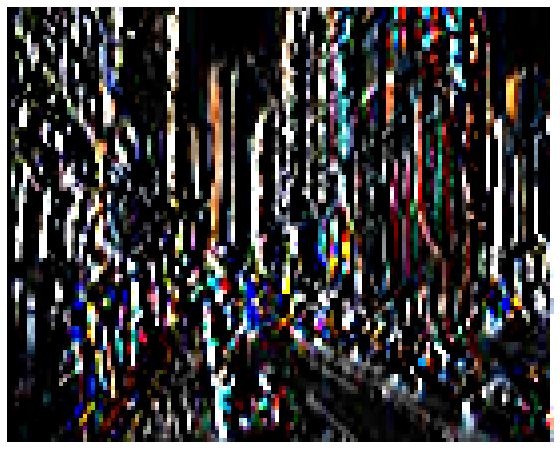

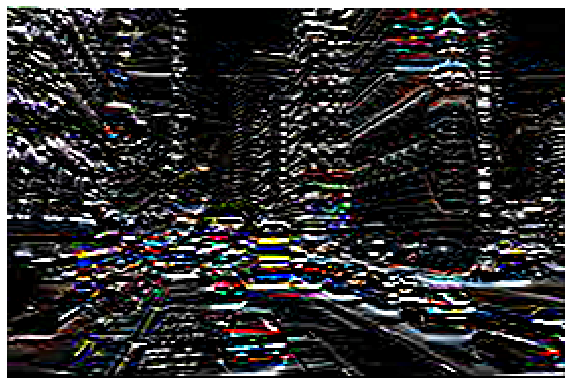

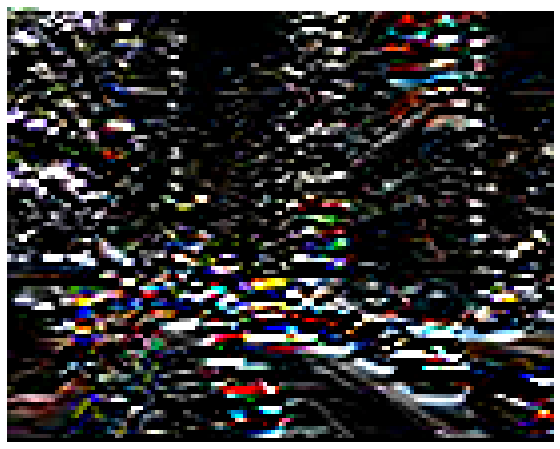

In [216]:
image_2 = load('images/many_cars.jpg')
display(image_2)
resize_img_2 = resize(image_2, 0.5, 0.6) #resize the image
display(resize_img_2)

print("--------    gaussian filters    --------")

# gauss kernel
gauss_kernel_1 = gauss2D(3, 3)
gauss_kernel_2 = gauss2D(20, 3)
gauss_kernel_3 = gauss2D(20, 1)

new_img_1 = conv(image_2, gauss_kernel_1)
new_img_11 = conv(resize_img_2, gauss_kernel_1)
new_img_2 = conv(image_2, gauss_kernel_2)
new_img_3 = conv(image_2, gauss_kernel_3)

display(new_img_1)
display(new_img_11)
display(new_img_2)
display(new_img_3)

print("--------      sobel filters     --------")

# sobel kernel
sobel_kernel_veritcal = np.array(
    [
        [-1,0,1],
        [-2,0,2],
        [-1,0,1]
    ])

sobel_kernel_horizontal = np.array(
    [
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])

new_img_4 = conv(image_2, sobel_kernel_veritcal)
new_img_44 = conv(resize_img_2, sobel_kernel_veritcal)
new_img_5 = conv(image_2, sobel_kernel_horizontal)
new_img_55 = conv(resize_img_2, sobel_kernel_horizontal)

display(new_img_4)
display(new_img_44)
display(new_img_5)
display(new_img_55)

***

--------    gaussian filters    --------


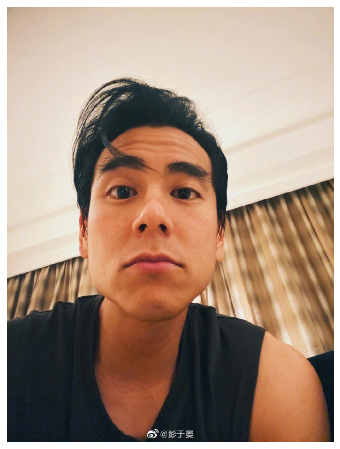

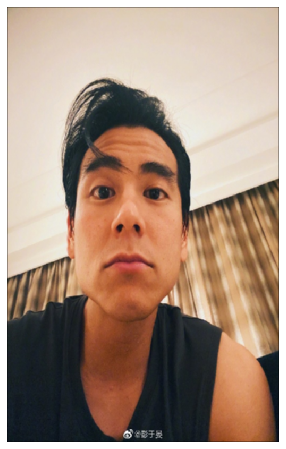

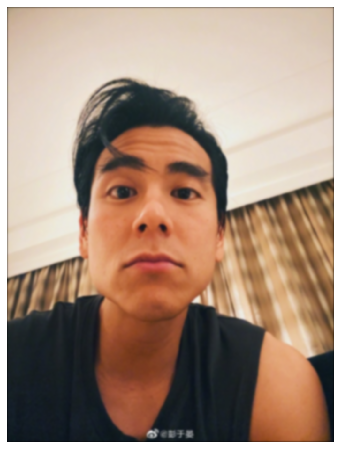

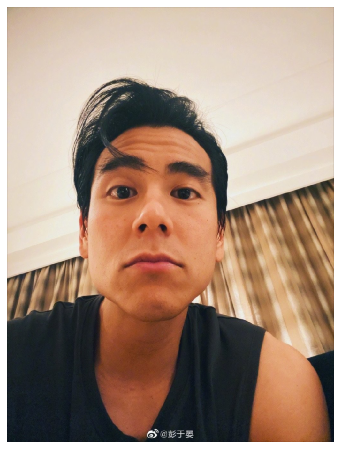

--------      sobel filters     --------


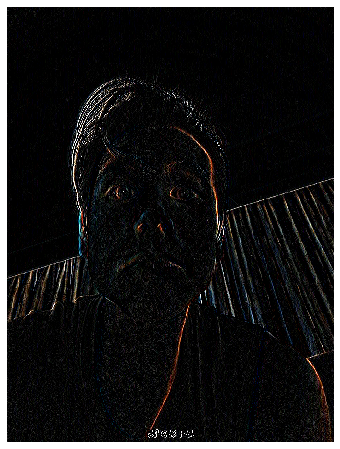

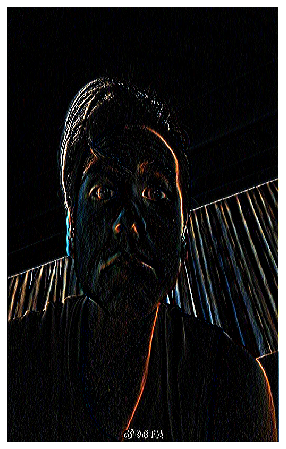

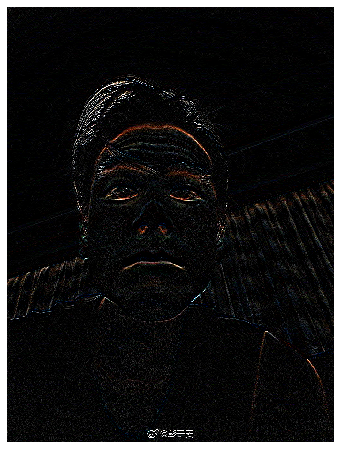

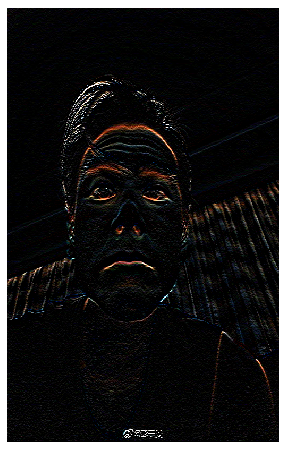

In [226]:
image_3 = load('images/man.jpg')
# display(image_3)
resize_img_3 = resize(image_3, 0.5, 0.6) #resize the image
# display(resize_img_3)

print("--------    gaussian filters    --------")

# gauss kernel
gauss_kernel_1 = gauss2D(3, 3)
gauss_kernel_2 = gauss2D(20, 3)
gauss_kernel_3 = gauss2D(20, 1)

new_img_1 = conv(image_3, gauss_kernel_1)
new_img_11 = conv(resize_img_3, gauss_kernel_1)
new_img_2 = conv(image_3, gauss_kernel_2)
new_img_3 = conv(image_3, gauss_kernel_3)

display(new_img_1)
display(new_img_11)
display(new_img_2)
display(new_img_3)

print("--------      sobel filters     --------")

# sobel kernel
sobel_kernel_veritcal = np.array(
    [
        [-1,0,1],
        [-2,0,2],
        [-1,0,1]
    ])

sobel_kernel_horizontal = np.array(
    [
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])

new_img_4 = conv(image_3, sobel_kernel_veritcal)
new_img_44 = conv(resize_img_3, sobel_kernel_veritcal)
new_img_5 = conv(image_3, sobel_kernel_horizontal)
new_img_55 = conv(resize_img_3, sobel_kernel_horizontal)

display(new_img_4)
display(new_img_44)
display(new_img_5)
display(new_img_55)

***Your comments/analysis of your results here...***

***

***3.3***
-

- When try the bigger size of Gaussian filter, the image become blurry with larger size (same segima).
- When try change the segimar of Gaussian filter, high sigma values blur over a wider radius. It means with the same size, larger sigma would make image be more blurrly.
- With the same Guassian filter, the smaller image (size) will be more blurry than the larger image (size).

***3.4***
-

- When apply horizontal sobel filter, the horizonal characteristics of the photo become more obvious.
- When apply veryical sobel filter , the vertical characteristics of the photo become more obvious.
- When the image size become smaller, The characteristics of the photo become more blur.

## Question 4: Image sampling and pyramids (25%)

### 4.1 Image Sampling

Apply your `resize()` function to reduce an image (I) to 0.125 height and width, and then to enlarge the image back to its original size to get an image (I'). Display and compare I and I'.

Apply a Sobel filter to I to get the edge image E.

Apply a Sobel filter to I' to get the edge image E'.

Display and compare E and E'. What do you observe and why?

### 4.2 Image Pyramids 
Creat a Gaussian pyramid as described in week2's lecture on an image.

Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

Display these four images following the zebra example shown in the lecture note.

What is your observation?



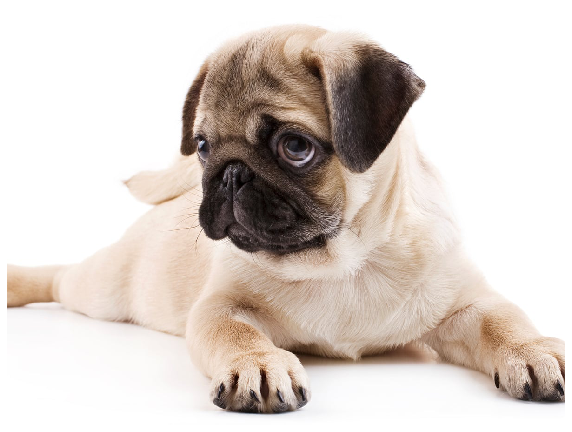

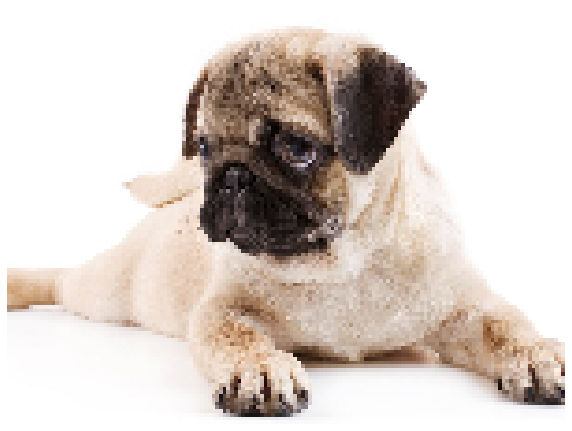

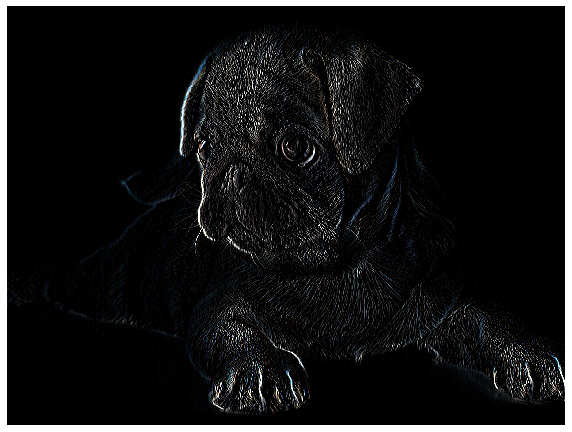

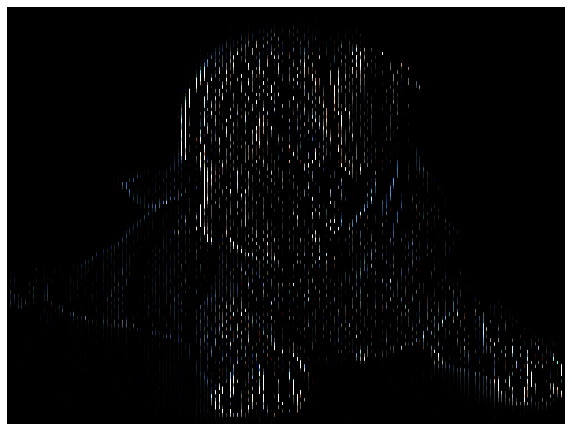

In [207]:
# Your answers to question 4 here
I = load('images/dog.jpg')
display(I)
# print(I.shape)

resize_I = resize(I, 0.125, 0.125)
# display(resize_I)
# print(resize_I.shape)

II = resize(resize_I, 8, 8)
display(II)
# print(II.shape)


sobel_kernel_veritcal = np.array(
    [
        [-1,0,1],
        [-2,0,2],
        [-1,0,1]
    ])

new_I = conv(I, sobel_kernel_veritcal)
display(new_I)

new_II = conv(II, sobel_kernel_veritcal)
display(new_II)

***

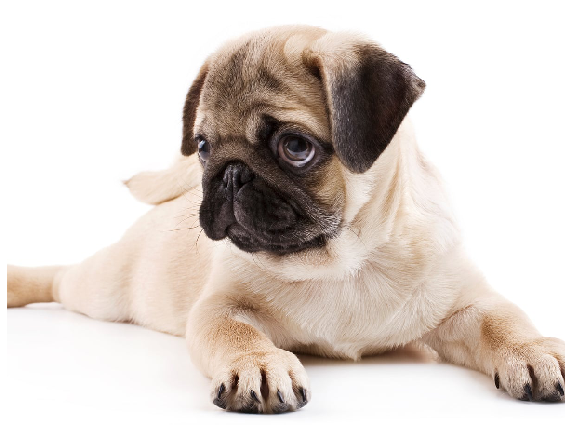

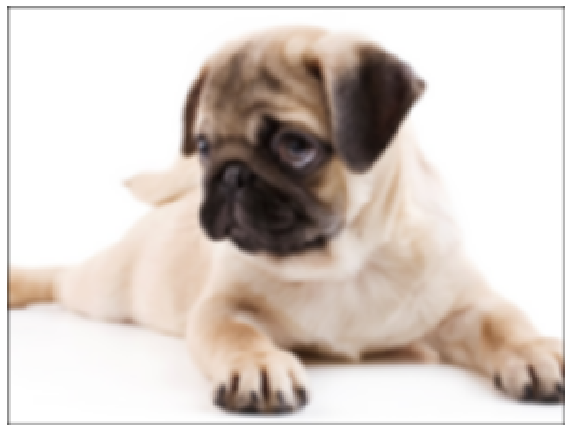

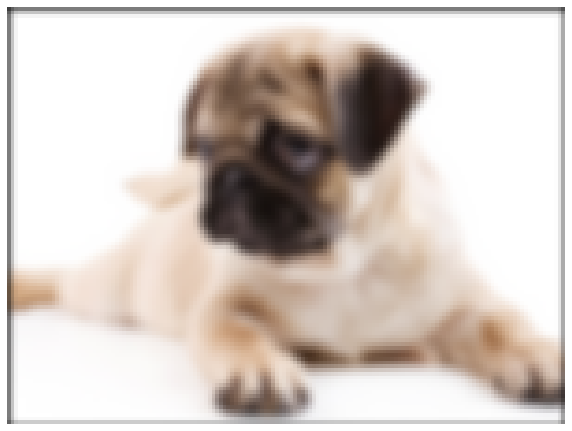

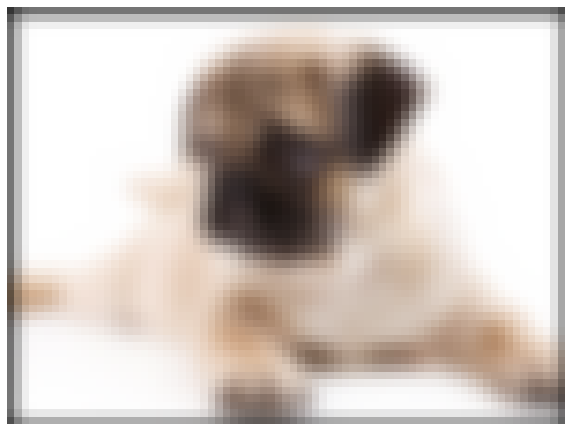

In [208]:
P = load('images/dog.jpg')

Gauss_filter = gauss2D(9, 3)


# ---- first ----
# blur
PP = conv(PP, Gauss_filter)

# subsamp
resize_PP = resize(P, 0.5, 0.5)
display(resize_PP)

# ----- second -----
# blur
PPP = conv(resize_PP, Gauss_filter)

# subsamp
resize_PPP = resize(PPP, 0.5, 0.5)
display(resize_PPP)

# ---- third -----
# blur
PPPP = conv(resize_PPP, Gauss_filter)

# subsamp
resize_PPPP = resize(PPPP, 0.5, 0.5)
display(resize_PPPP)

# ---- fourth -----
# blur
PPPPP = conv(resize_PPPP, Gauss_filter)

# subsamp
resize_PPPPP = resize(PPPPP, 0.5, 0.5)
display(resize_PPPPP)

***Your comments/analysis of your results here...***

***

***4.1***
- 
- when zoom the image out, and then zoom in. The image will lose many features and more blurry than the orignal image.

- When I try apply sobel filter to I and I'(II) to get the image (E and E'), I notice that E has more detailes than E'.

***4.2***
- 

- We repeat blur (apply the Gaussian filter) than subsamp (resize with ratio 0.5). Through these steps, I notice the final image preserved mostly large uniform regions in the original image.

## Question 5: Auto correlation (20%)

Recall from week 2 that cross-correlation is a measure of similarity between a template and an image. It is defined similarly to convolution.

### 5.1 Correlation function

Implement the function `corr()` in a1code.py, based on your convolution function. Hint: numpy's `flip()` function may be useful here.

### 5.2 Auto-correlation

We will experiment with *auto-correlation*, where the template patch is taken from the image it is being compared to. Use the cropped eye from Question 2 as your template. Calculate the correlation of that template with every location in the image, and display the output as an image. Where is the maximum similarity? (Hint: numpy functions `argmax()` and `unravel()` will be useful here). For simplicity, you can use a greyscale version of the image and template.

Is it what you expect? Why or why not?

### 5.3 Modified auto-correlation

Try modifying your correlation template or the base image in different ways, and analyse the effect on correlation results. For example:

- if you did not find the correct location in 5.2, try centering the template about its mean (i.e. subtracting the mean brightness from each pixel)
- if you did find the correct location in 5.2, try using `resize()` and `change_contrast()` on the image. Where does it fail?

As before you will obtain marks for coming up with interesting tests and analysis, and displaying your results clearly. 


In [209]:
# Your code to answer question 5 and display results here

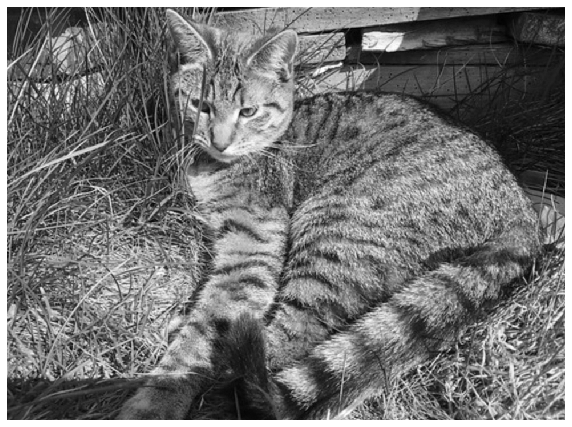

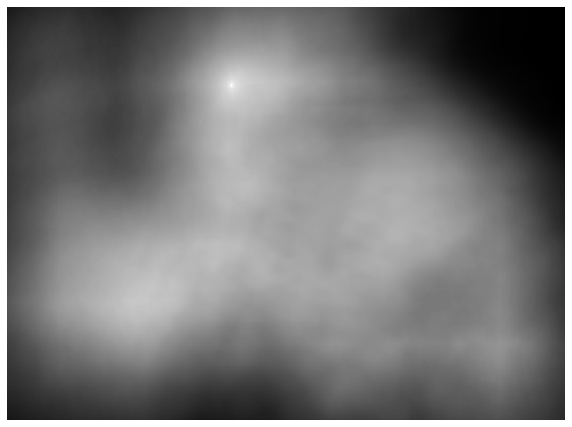

the index is  (138, 393)


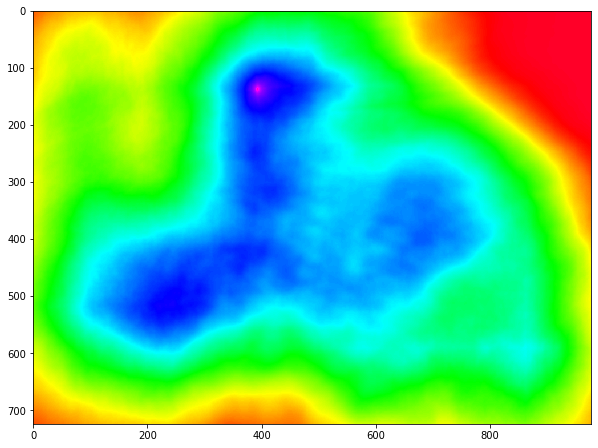

In [210]:
import matplotlib.cm as cm

test = load('images/cat.jpg')
# test = resize(test, 0.5, 0.6)
img = greyscale(test)
display(img)
img = change_contrast(img, 2)

kernel = crop(img, 278, 5, 508, 272)
# display(kernel)

corr_img = corr(img, kernel)
display(corr_img)

img_max = np.argmax(corr_img)

index = np.unravel_index(img_max, corr_img.shape)
print("the index is ", index)

plt.imshow(corr_img, interpolation='nearest', cmap=cm.gist_rainbow)
plt.show()

***

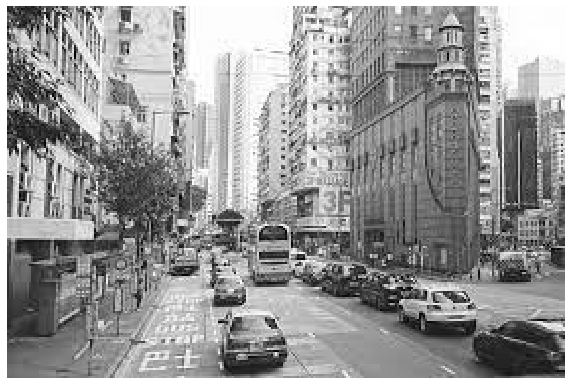

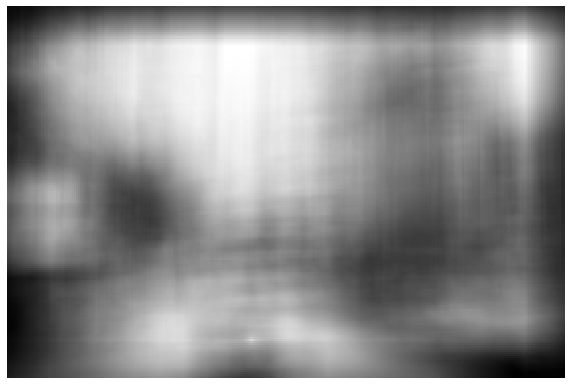

the index is  (19, 110)


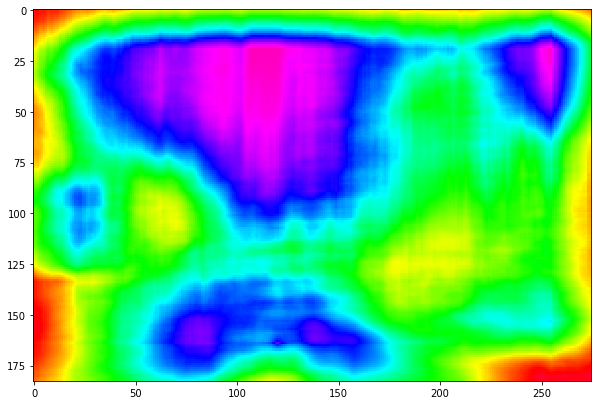

In [211]:
import matplotlib.cm as cm

test2 = load('images/many_cars.jpg')
# test2 = resize(test2, 0.8, 0.8)  ----- this is a test
img = greyscale(test2)
display(img)
img = change_contrast(img, 2)

kernel2 = crop(img, 100, 145, 140, 200)
# display(kernel)

corr_img = corr(img, kernel2)
display(corr_img)

img_max = np.argmax(corr_img)

index = np.unravel_index(img_max, corr_img.shape)
print("the index is ", index)

plt.imshow(corr_img, interpolation='nearest', cmap=cm.gist_rainbow)
plt.show()

***

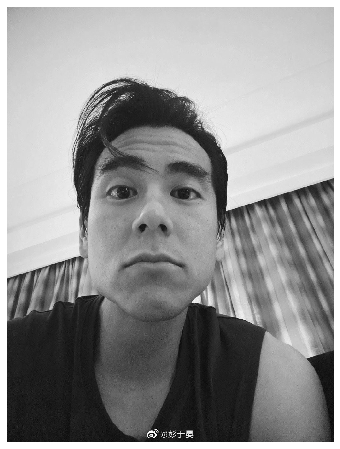

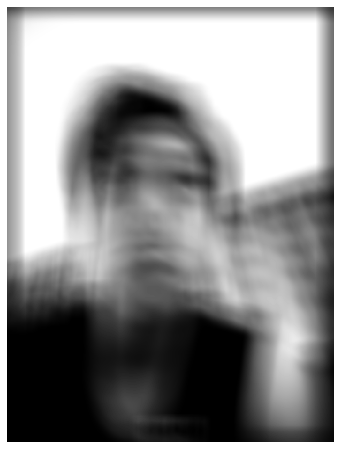

the index is  (52, 322)


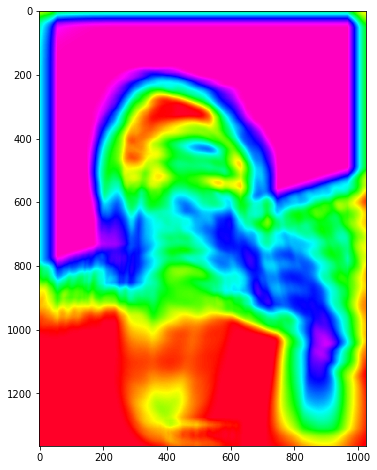

In [212]:
import matplotlib.cm as cm

test3 = load('images/man.jpg')
# test3 = resize(test3, 0.5, 0.4) 
img = greyscale(test3)
display(img)
img = change_contrast(img, 2)

kernel3 = crop(img, 500, 520, 615, 625)
# display(kernel)

corr_img = corr(img, kernel3)
display(corr_img)

img_max = np.argmax(corr_img)

index = np.unravel_index(img_max, corr_img.shape)
print("the index is ", index)

plt.imshow(corr_img, interpolation='nearest', cmap=cm.gist_rainbow)
plt.show()

***

In [213]:
test1_shape = test.shape
test2_shape = test2.shape
test3_shape = test3.shape

In [214]:
kernel1_shape = kernel.shape
kernel2_shape = kernel2.shape
kernel3_shape = kernel3.shape

In [215]:
print("test shape")
print(test1_shape)
print(test2_shape)
print(test3_shape)

print("")

print("kernel shape")
print(kernel1_shape)
print(kernel2_shape)
print(kernel3_shape)

test shape
(724, 978, 3)
(183, 275, 3)
(1365, 1024, 3)

kernel shape
(267, 230)
(38, 40)
(105, 115)


***5.2***
- 

***

***test 1 (cat) ---- sucessful***

- This test is to find the cat head in the original image. Through the Cross correlation function, we can see the position of the white point is actually the position of the car head in original image. 

- Through the Matplotlib, we can see clearly.

***test 2 (car) ---- sucessful***

- This test_2 is to find the red car in the original image. Through the Cross correlation function, we can see the position of the white point is actually the position of the red car in original image. 

- However, through the Matplotlib, we cannot make sure the position of the red car. It is quite intersting.

***test 3 (man) ---- fail***

- This test_3 is to find the eye in the original image. Through the Cross correlation function, we cannot find the correct position of the eyes.

- I print the shape of the original image and the shape of the kernel (target image or cropped image), we can see the ratio between the image and the kernel clearly. The reason I guess why test_3 fails is that kernel 3 (shape) is much smaller than the orignal image, so when we use cross correlation function, the image is not work very well.

***5.3***
- 

***

- when I try change_constract() to the image (such as factor 2 in the test 2), I notice if the factor is larger than 1, the correct position would be more obvious. And if the factor is smaller than 1, the correct position will be blurry.

- when I try resize() to the image (such as factor 0.8, 0.8 in test 2), I notice the image become strange after cross correlation, and can not see any details from the image (seems many details are already changed after resizing).